In [1]:
import pandas as pd
from pandas import Series,DataFrame
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from prophet import Prophet

In [2]:
df = pd.read_csv('PG.csv')
df.head()

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,02-01-1970,1.708984,1.710938,832000,1.722656,1.718750,0.394717
1,05-01-1970,1.708984,1.718750,518400,1.730469,1.726563,0.396512
2,06-01-1970,1.707031,1.722656,480000,1.722656,1.718750,0.394717
3,07-01-1970,1.722656,1.722656,710400,1.750000,1.746094,0.400997
4,08-01-1970,1.742188,1.746094,531200,1.773438,1.765625,0.405482


In [3]:
df_new = df.rename(columns={'Date': 'ds', 'Close' : 'y'})
m = Prophet()
m.fit(df_new)

/Users/fuangritsrinual/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:1114: UserWarning: Parsing '13-01-1970' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()
/Users/fuangritsrinual/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:1114: UserWarning: Parsing '14-01-1970' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()
/Users/fuangritsrinual/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:1114: UserWarning: Parsing '15-01-1970' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()
/Users/fuangritsrinual/opt/anaconda3/lib/py

/Users/fuangritsrinual/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:1114: UserWarning: Parsing '17-04-2002' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()
/Users/fuangritsrinual/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:1114: UserWarning: Parsing '18-04-2002' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()
/Users/fuangritsrinual/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:1114: UserWarning: Parsing '19-04-2002' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()
/Users/fuangritsrinual/opt/anaconda3/lib/py

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

00:54:04 - cmdstanpy - INFO - Chain [1] done processing


In [4]:
future = m.make_future_dataframe(periods=2190)
future.tail()

,ds
15443,2028-12-01
15444,2028-12-02
15445,2028-12-03
15446,2028-12-04
15447,2028-12-05


In [5]:
df_new.shape

(13258, 7)

In [6]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
15443,2028-12-01,183.241236,163.779395,199.397278
15444,2028-12-02,183.635873,165.002715,201.141239
15445,2028-12-03,183.141231,164.347282,199.098620
15446,2028-12-04,183.273676,163.488355,200.077752
15447,2028-12-05,183.377647,164.633616,199.947224


In [7]:
forecast.shape

(15448, 19)

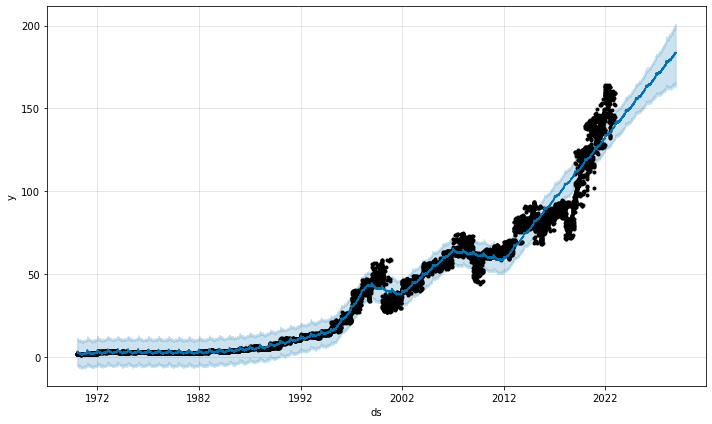

In [8]:
fig1 = m.plot(forecast)

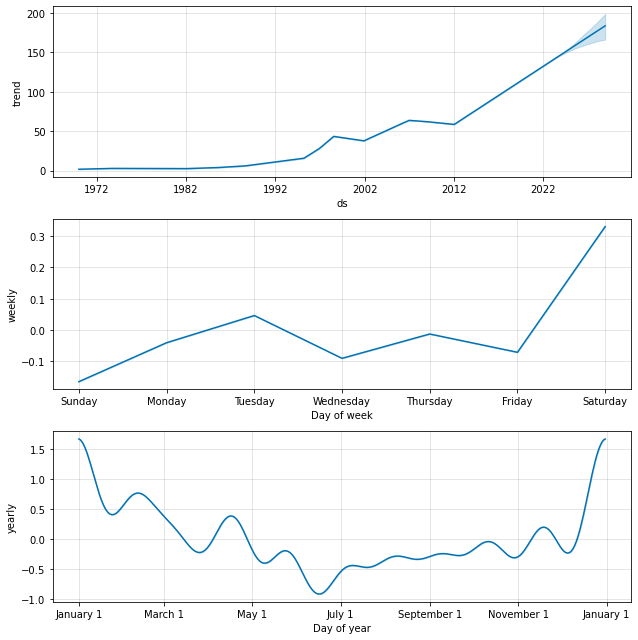

In [9]:
fig2 = m.plot_components(forecast)

In [10]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)